loading the data from kaggle using ready to use functions from kaggle user  notebook link()


In [1]:
import kagglehub
puneet6060_intel_image_classification_path = kagglehub.dataset_download('puneet6060/intel-image-classification')

print('Data source import complete.')


Data source import complete.


In [2]:
import os
import cv2
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Input, Dropout,Flatten, Conv2D
from tensorflow.keras.layers import BatchNormalization, Activation, MaxPooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import confusion_matrix , classification_report
from sklearn.utils import shuffle
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

2025-07-23 09:48:12.203934: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753264092.426491      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753264092.489487      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
class_names = ['mountain', 'street', 'glacier', 'buildings', 'sea', 'forest']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

Image_Size = (150,150)

print(class_names_label)

{'mountain': 0, 'street': 1, 'glacier': 2, 'buildings': 3, 'sea': 4, 'forest': 5}


In [6]:
dataset = r"D:\Deep Learning and reinforcment\data\intel\seg_train\seg_train"
os.listdir(dataset)

FileNotFoundError: [Errno 2] No such file or directory: 'D:\\Deep Learning and reinforcment\\data\\intel\\seg_train\\seg_train'

In [7]:
def Load_Train():
    dataset = '/kaggle/input/intel-image-classification/seg_train/seg_train'
    # dataset = r"D:\Deep Learning and reinforcment\data\intel\seg_train\seg_train"

    Images = []
    Labels = []

    for folder in os.listdir(dataset):

        for file in tqdm(os.listdir(os.path.join(dataset,folder))):
            image_path = os.path.join(os.path.join(dataset,folder),file)

            image = cv2.imread(image_path)
            if image is None:
                print(f"Warning: Unable to read image {image_path}. Skipping.")
                continue
            image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
            image = cv2.resize(image , Image_Size)

            Images.append(image)
            Labels.append(class_names_label[folder])

    Images = np.array(Images , dtype='float32')
    Labels = np.array(Labels , dtype='int32')

    return (Images , Labels)

(train_image , train_label) = Load_Train()

100%|██████████| 2404/2404 [00:16<00:00, 147.25it/s]


In [8]:
def Load_Test():
    # Update the path to your local test dataset directory
    dataset = '/kaggle/input/intel-image-classification/seg_test/seg_test'

    if not os.path.exists(dataset):
        raise FileNotFoundError(f"Test dataset directory not found: {dataset}")

    Images = []
    Labels = []

    for folder in os.listdir(dataset):
        folder_path = os.path.join(dataset, folder)
        if not os.path.isdir(folder_path):
            continue

        for file in tqdm(os.listdir(folder_path)):
            image_path = os.path.join(folder_path, file)

            image = cv2.imread(image_path)
            if image is None:
                print(f"Warning: Unable to read image {image_path}. Skipping.")
                continue
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, Image_Size)

            Images.append(image)
            Labels.append(class_names_label[folder])

    Images = np.array(Images, dtype='float32')
    Labels = np.array(Labels, dtype='int32')

    return (Images, Labels)

(test_image, test_label) = Load_Test()

100%|██████████| 553/553 [00:03<00:00, 180.15it/s]


In [9]:
train_image , train_label = shuffle(train_image , train_label , random_state= 25)

In [10]:
train_image.shape , test_image.shape

((14034, 150, 150, 3), (3000, 150, 150, 3))

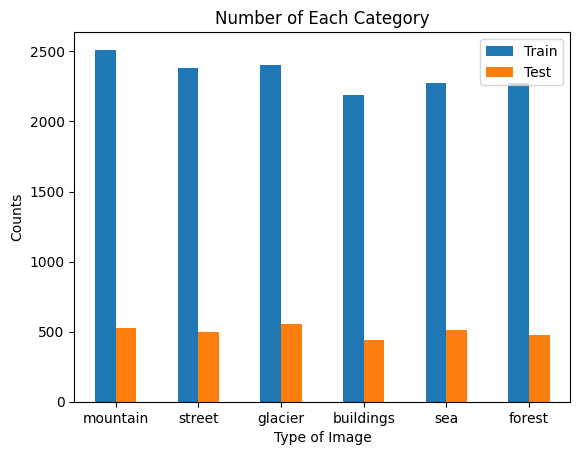

In [11]:
_ , train_counts = np.unique(train_label , return_counts = True)
_ , test_counts = np.unique(test_label , return_counts = True)

df = pd.DataFrame({'Train':train_counts,
              'Test':test_counts},index = class_names)

df.plot.bar()
plt.xticks(rotation = 0)
plt.title('Number of Each Category')
plt.ylabel('Counts')
plt.xlabel('Type of Image')
plt.show()

In [ ]:
df

,Train,Test
mountain,2512,525
street,2382,501
glacier,2404,553
buildings,2191,437
sea,2274,510
forest,2271,474


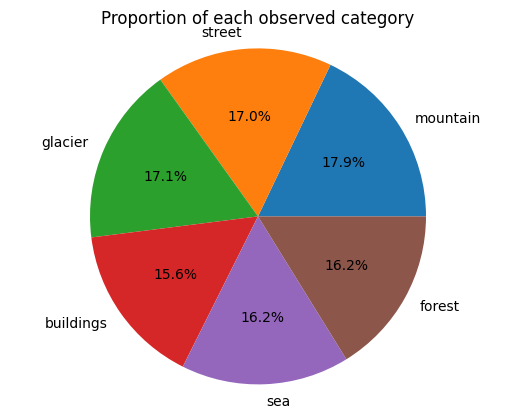

In [ ]:
plt.pie(train_counts,
        explode=(0, 0, 0, 0, 0, 0) ,
        labels=class_names,
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each observed category')
plt.show()

In [12]:
train_image /= 255.0
test_image /= 255.0

<Figure size 1500x2000 with 0 Axes>

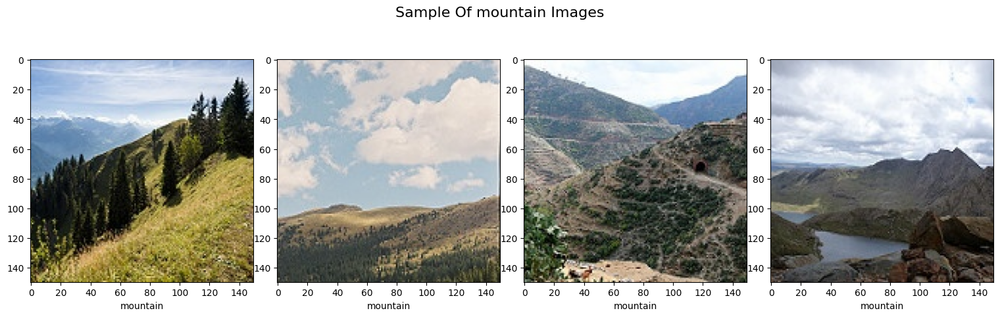

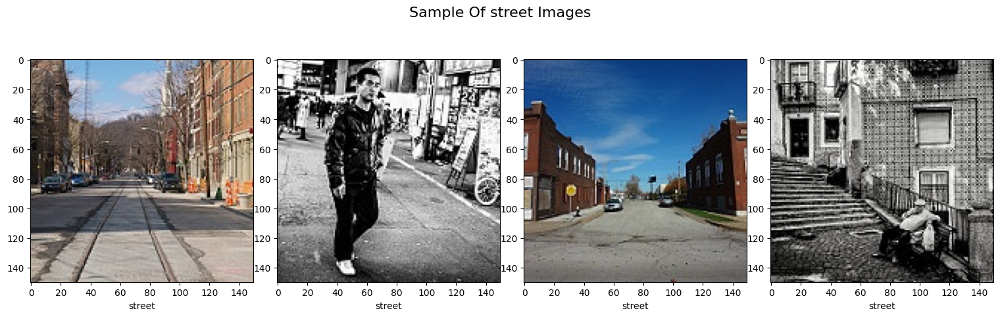

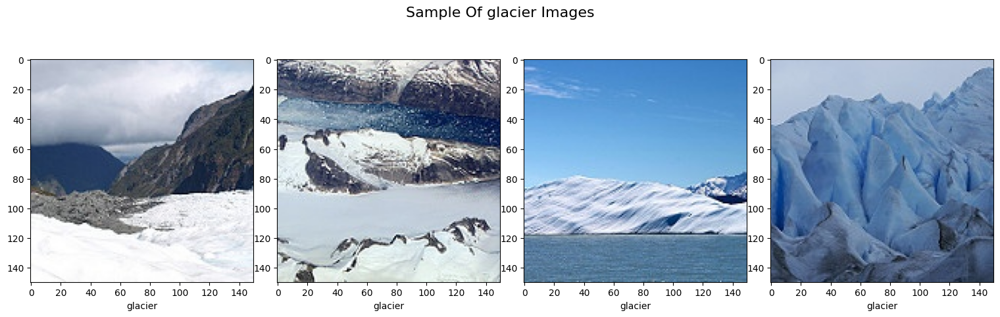

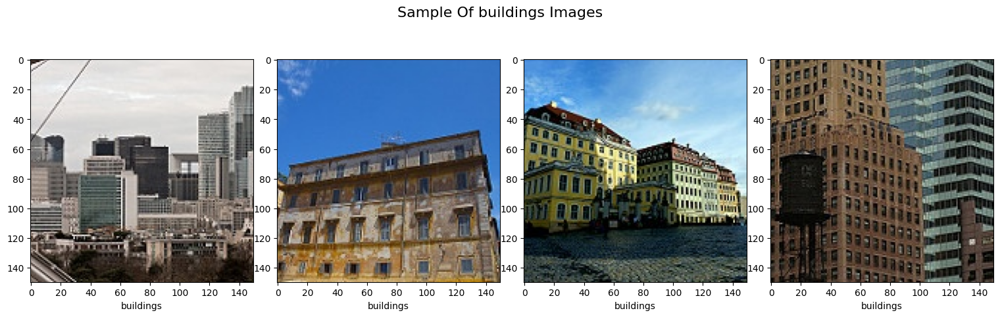

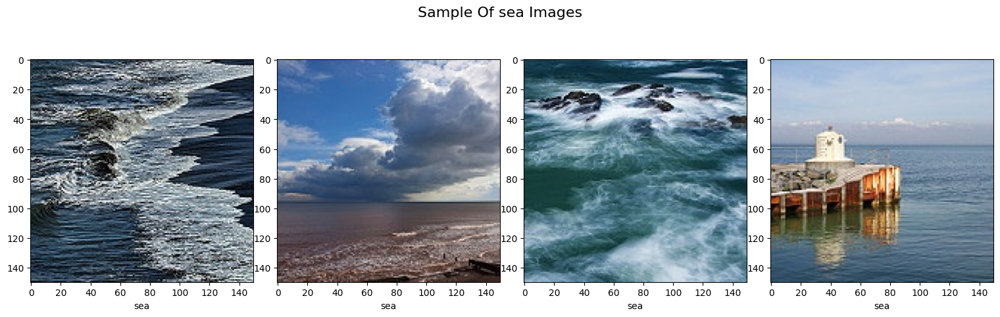

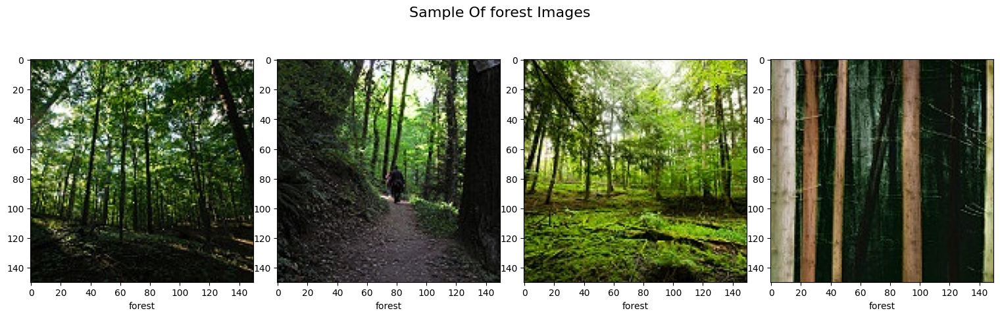

In [ ]:
plt.figure(figsize=(15,20))
plt.suptitle(f"Sample Images from each Class" , fontsize=16)
for class_index in range(len(class_names)) :
    plt.figure(figsize=(15,5))
    plt.suptitle(f"Sample Of {class_names[class_index]} Images" , fontsize=16)
    Category_list = np.where(train_label == class_index)[0]
    for i in range(4):
        plt.subplot(1,4,i+1)
        idx = np.random.choice(Category_list)
        plt.imshow(train_image[idx])
        plt.xlabel(f'{class_names[train_label[idx]]}')
        plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)
    plt.show()

In [15]:
image_size = (150,150,3)
batch_size = 32
num_classes = 6

In [16]:
model = Sequential([
    Conv2D(32 ,kernel_size= (3,3) , activation= 'relu' , input_shape = image_size ),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64 ,kernel_size= (3,3) , activation= 'relu' , input_shape = image_size),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128 ,kernel_size= (3,3) , activation= 'relu' , input_shape = image_size),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128 , activation= 'relu', ),
    Dropout(0.4),
    Dense(64 , activation= 'relu', ),
    Dropout(0.4),
    Dense(6, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

2025-07-23 09:52:35.790447: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,836,998 (18.45 MB)

 Trainable params: 4,836,998 (18.45 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
test1 = model.fit(train_image, train_label, batch_size=32, epochs=5, validation_split = 0.2,
                         )

Epoch 1/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 539s 2s/step - accuracy: 0.3878 - loss: 1.4444 - val_accuracy: 0.6587 - val_loss: 0.8882
Epoch 2/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 528s 2s/step - accuracy: 0.6012 - loss: 1.0000 - val_accuracy: 0.6990 - val_loss: 0.8026
Epoch 3/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 550s 1s/step - accuracy: 0.6954 - loss: 0.8162 - val_accuracy: 0.7702 - val_loss: 0.6595
Epoch 4/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 567s 1s/step - accuracy: 0.7588 - loss: 0.6836 - val_accuracy: 0.7431 - val_loss: 0.7318
Epoch 5/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 566s 1s/step - accuracy: 0.7964 - loss: 0.5871 - val_accuracy: 0.8108 - val_loss: 0.5572


In [ ]:
print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,510,996 (55.36 MB)

 Trainable params: 4,836,998 (18.45 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,673,998 (36.90 MB)

None


In [17]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(20,10))

    # Plot accuracy
    plt.subplot(121)
    plt.plot(history.history['accuracy'],'-', label = "acc")
    plt.plot(history.history['val_accuracy'], '--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(122)
    plt.plot(history.history['loss'],'-', label = "loss")
    plt.plot(history.history['val_loss'], '--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()
# plot_accuracy_loss(test1)

In [ ]:
model.evaluate(test_image,test_label)

94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 628ms/step - accuracy: 0.7931 - loss: 0.5683


[0.5691894292831421, 0.7979999780654907]

In [ ]:
predictions = model.predict(test_image)     # Vector of probabilities
pred_labels = np.argmax(predictions, axis = 1) # We take the highest probability

94/94 ━━━━━━━━━━━━━━━━━━━━ 37s 392ms/step


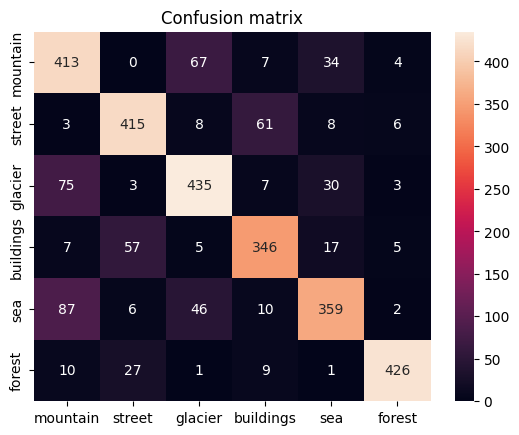

In [ ]:
CM = confusion_matrix(test_label, pred_labels)
ax = plt.axes()
sns.heatmap(CM, annot=True,
           annot_kws={"size": 10},
           xticklabels = class_names,
           yticklabels = class_names,
           ax = ax,
           fmt='d')
ax.set_title('Confusion matrix')
plt.show()

In [ ]:
print(classification_report(test_label, pred_labels,target_names = class_names))

              precision    recall  f1-score   support

    mountain       0.69      0.79      0.74       525
      street       0.82      0.83      0.82       501
     glacier       0.77      0.79      0.78       553
   buildings       0.79      0.79      0.79       437
         sea       0.80      0.70      0.75       510
      forest       0.96      0.90      0.93       474

    accuracy                           0.80      3000
   macro avg       0.80      0.80      0.80      3000
weighted avg       0.80      0.80      0.80      3000



In [18]:
def Load_Predict():
    dataset = '/kaggle/input/intel-image-classification/seg_pred/seg_pred'

    predict_image = []

    for file in tqdm(os.listdir(dataset)):
        image_path = os.path.join(dataset,file)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        image = cv2.resize(image,Image_Size)
        predict_image.append(image)

    predict_image = np.array(predict_image , dtype = 'float32')

    return predict_image

predict_image = Load_Predict()

100%|██████████| 7301/7301 [01:08<00:00, 106.19it/s]


In [ ]:
predict_image_pred = model.predict(predict_image)
predict_image_pred = np.argmax(predict_image_pred , axis=1)
predict_image_pred

229/229 ━━━━━━━━━━━━━━━━━━━━ 91s 397ms/step


array([4, 1, 0, ..., 3, 5, 3])

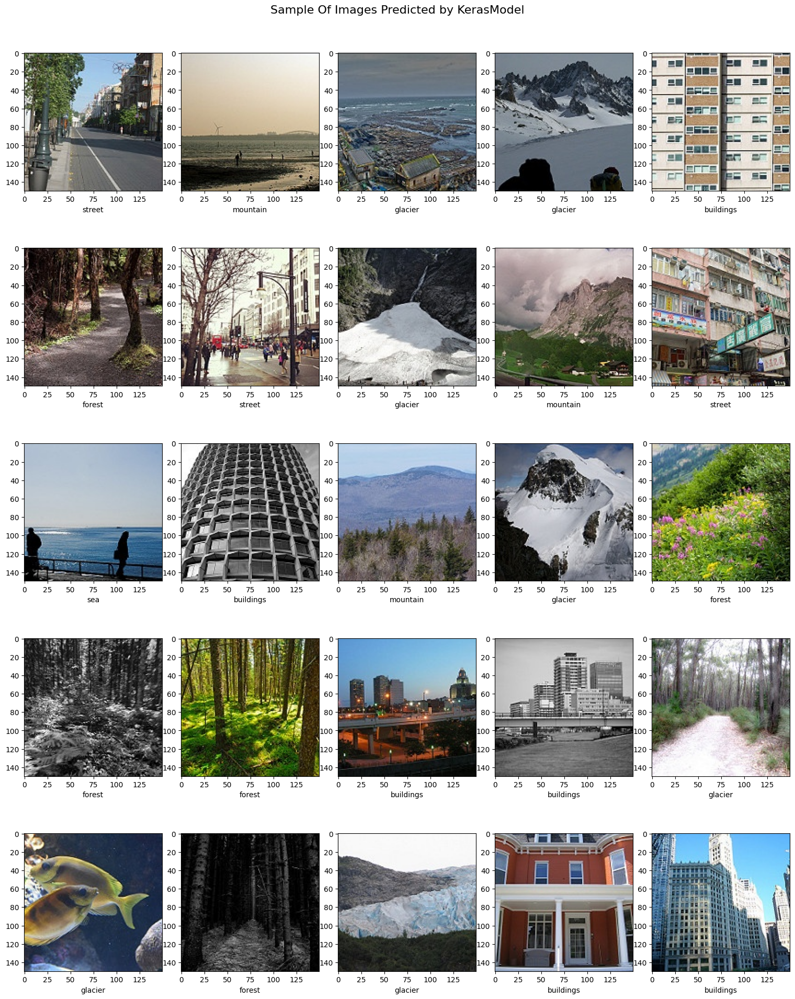

In [ ]:
plt.figure(figsize=(15,20))
plt.suptitle(f"Sample Of Images Predicted by KerasModel" , fontsize=16)

for i in range(25):
    plt.subplot(5,5,i+1)
    idx = np.random.choice(np.arange(len(predict_image_pred)))
    plt.imshow(predict_image[idx] / 255.0)
    plt.xlabel(f'{class_names[predict_image_pred[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

NOw try using transfer learning

In [25]:
from tensorflow.keras.applications.resnet50 import ResNet50

In [28]:
base_model =  ResNet50(include_top=False, weights='imagenet', input_shape=(150,150,3))

Exception: URL fetch failure on https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5: None -- [Errno -3] Temporary failure in name resolution

In [31]:
base_model = ResNet50(include_top=False,
                      weights='/kaggle/input/resneet50/tensorflow2/default/1/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5',
                      input_shape=(150, 150, 3))


In [32]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 156, 156,  │          0 │ input_layer_6[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 75, 75,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 75, 75,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 75, 75,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 77, 77,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 38, 38,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 38, 38,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 38, 38,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 38, 38,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 38, 38,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 38, 38,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 38, 38,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 38, 38,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 38, 38,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 38, 38,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 38, 38,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [33]:
base_model.trainable = False

In [34]:
from tensorflow.keras.layers import GlobalAveragePooling2D

In [35]:
model_2 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.4),
    Dense(64, activation='relu'),
    Dropout(0.4),
    Dense(6, activation='softmax')
])

model_2.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model_2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 5, 5, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,630 (91.01 MB)

 Trainable params: 270,918 (1.03 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [36]:
history_tl = model_2.fit(
    train_image, train_label,
    validation_split=0.3,
    epochs=5,
    batch_size=32
)




Epoch 1/5
307/307 ━━━━━━━━━━━━━━━━━━━━ 510s 2s/step - accuracy: 0.1694 - loss: 1.8634 - val_accuracy: 0.2850 - val_loss: 1.7492
Epoch 2/5
307/307 ━━━━━━━━━━━━━━━━━━━━ 487s 2s/step - accuracy: 0.2331 - loss: 1.7460 - val_accuracy: 0.3396 - val_loss: 1.6635
Epoch 3/5
307/307 ━━━━━━━━━━━━━━━━━━━━ 489s 2s/step - accuracy: 0.2922 - loss: 1.6719 - val_accuracy: 0.3441 - val_loss: 1.5837
Epoch 4/5
307/307 ━━━━━━━━━━━━━━━━━━━━ 487s 2s/step - accuracy: 0.3201 - loss: 1.5980 - val_accuracy: 0.4213 - val_loss: 1.5007
Epoch 5/5
307/307 ━━━━━━━━━━━━━━━━━━━━ 500s 2s/step - accuracy: 0.3562 - loss: 1.5205 - val_accuracy: 0.4341 - val_loss: 1.4318
